# Учись Машина Учись / Learn Machine Learn

<img src="data/lml.png" width=200>

Онлайн-лекции Ильи С. Елисеева: применение методов машинного обучения в анализе данных.

- Канал в Telegram: https://t.me/learn_machine_learn
- YouTube: https://www.youtube.com/channel/UCCwDwKatNitBCVAJajremMQ
- VK: https://vk.com/learn_machine_learn
- GitHub: https://github.com/easyise/learn_machine_learn

---



# Лекция 4. Латентные пространства


In [ ]:
!pip install torchinfo torchmetrics

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms

import matplotlib.pyplot as plt
import numpy as np

from torchinfo import summary

%matplotlib inline

device = "cuda" if torch.cuda.is_available() else \
    "mps" if torch.backends.mps.is_built() else "cpu"
device

'cuda'

### 1. Создание латентных пространств

Основная идея: снижение размерности данных с сохранением их ключевых характеристик, да еще и так, чтобы сохранилась возможность восстановления исходных данных из этого компактного представления.

То есть из, допустим, 784 признаков (например, изображения 28x28 пикселей) мы хотим получить 2 признака, и потом из этих 2 признаков мы хотим восстановить исходные 784 признака (то есть изображение).

Посмотрим на примере рукописных цифр из датасета MNIST.

In [2]:
transform = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = torchvision.datasets.MNIST(
    root="./data",
    train=True,
    download=True,
    transform=transform
)

test_dataset = torchvision.datasets.MNIST(
    root="./data",
    train=False,
    download=True,
    transform=transform
)

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=256,
    shuffle=True
)

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=256,
    shuffle=False
)

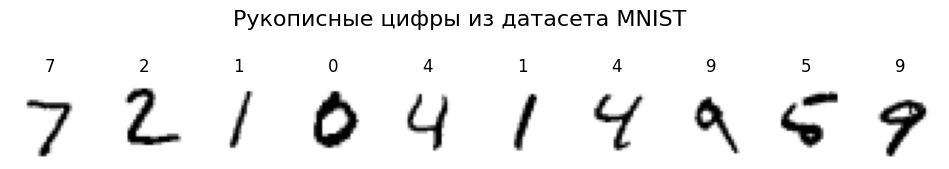

In [3]:
images, labels = next(iter(test_loader))

plt.figure(figsize=(12, 4))

for i in range(10):
    plt.subplot(2, 10, i + 1)
    plt.imshow(images[i].squeeze(), cmap="gray_r")
    plt.title(f"{labels[i].item()}")
    plt.axis("off")

plt.suptitle("Рукописные цифры из датасета MNIST", fontsize=16)
plt.show()

In [ ]:
images[0].shape

In [ ]:
(images[0].squeeze().numpy() * 256).astype(np.uint8)


## 1.1 Метод главных компонент (PCA)

Простейший способ: создаются новые признаки, каждый из которых является линейной комбинацией исходных признаков. Для данного набора данных с таким алгоритмом два признака - слишком мало, чтобы можно было восстановить исходные данные.

In [6]:
from sklearn.decomposition import PCA

sample_size = 2000
X = test_dataset.data[:sample_size].numpy().reshape(sample_size, -1) / 255.0
y = test_dataset.targets[:sample_size].numpy()

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)


In [5]:
def show_latent_space(z1, z2, y, ax, A=None, B=None, points=None, **kwargs):

    scatter = ax.scatter(
        z1,
        z2,
        c=y,
        cmap="tab10",
        s=5,
        alpha=0.75,
        **kwargs
    )

    if(A is not None and B is not None):
        # прямая между выбранными точками
        plt.plot(
            [A[0], B[0]],
            [A[1], B[1]],
            "k--",
            linewidth=2,
            alpha=0.5,
            label="Линия интерполяции"
        )

        # выделяем выбранные точки
        plt.scatter(
            [A[0], B[0]],
            [A[1], B[1]],
            c=["lime", "red"],
            s=100,
            edgecolors="gray",
            zorder=3
        )

    if points is not None:
        plt.scatter(points[:, 0], points[:, 1], c="black", s=20, marker="x")  # точки

    ax.set_xlabel("z1" if 'xlabel' not in kwargs else kwargs['xlabel'])
    ax.set_ylabel("z2" if 'ylabel' not in kwargs else kwargs['ylabel'])
    ax.set_title("Latent Space Representation")
    ax.figure.colorbar(scatter, ax=ax, label="Digit Class")
    ax.grid(alpha=0.2)


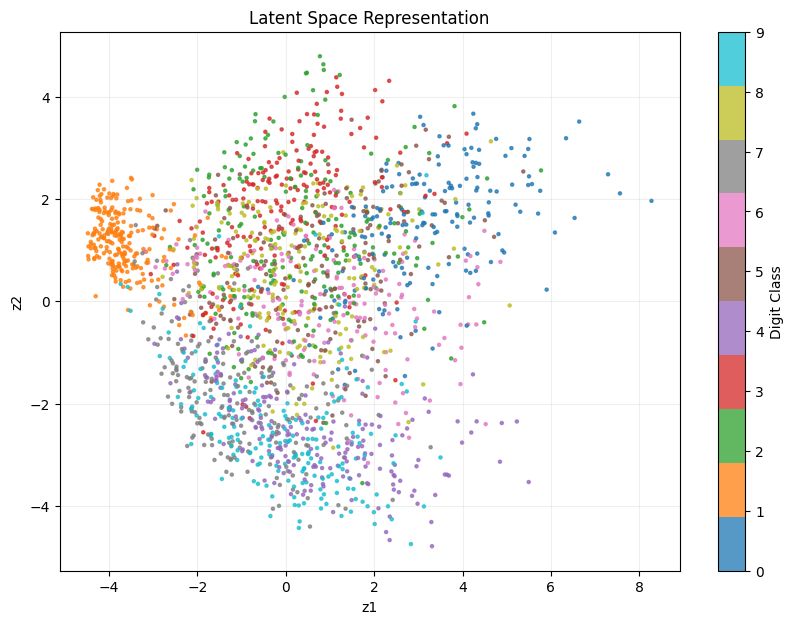

In [6]:
plt.figure(figsize=(10, 7))
show_latent_space(X_pca[:, 0], X_pca[:, 1], y, plt.gca())

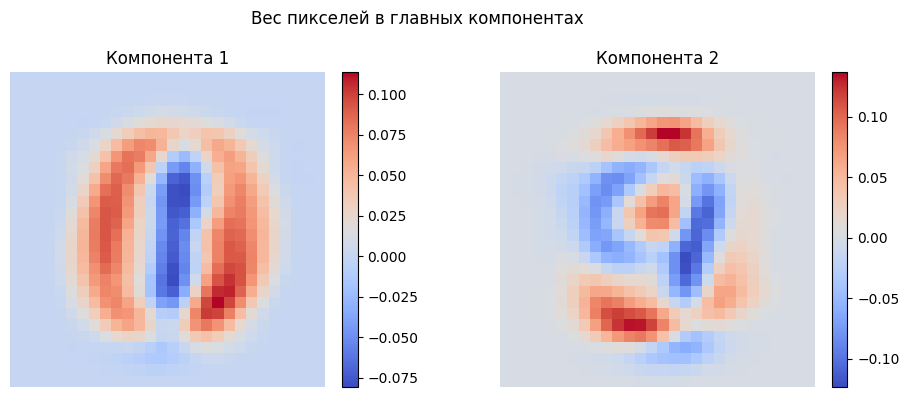

Доля объясненной дисперсии:
Компонента 1: 9.71%
Компонента 2: 7.56%

Компонента 1: 10 самых важных пикселей
 1. px_20_18 (строка=20, столбец=18) -> вес +0.1136
 2. px_19_19 (строка=19, столбец=19) -> вес +0.1076
 3. px_19_18 (строка=19, столбец=18) -> вес +0.1065
 4. px_18_19 (строка=18, столбец=19) -> вес +0.1044
 5. px_21_17 (строка=21, столбец=17) -> вес +0.1021
 6. px_21_18 (строка=21, столбец=18) -> вес +0.0991
 7. px_20_19 (строка=20, столбец=19) -> вес +0.0984
 8. px_20_17 (строка=20, столбец=17) -> вес +0.0983
 9. px_17_19 (строка=17, столбец=19) -> вес +0.0970
10. px_17_20 (строка=17, столбец=20) -> вес +0.0942

Компонента 2: 10 самых важных пикселей
 1. px_5_15 (строка=5, столбец=15) -> вес +0.1365
 2. px_5_14 (строка=5, столбец=14) -> вес +0.1355
 3. px_22_11 (строка=22, столбец=11) -> вес +0.1328
 4. px_22_12 (строка=22, столбец=12) -> вес +0.1320
 5. px_22_10 (строка=22, столбец=10) -> вес +0.1232
 6. px_16_16 (строка=16, столбец=16) -> вес -0.1231
 7. px_5_16 (строка=5, с

In [7]:
component_maps = pca.components_.reshape(2, 28, 28)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for idx, ax in enumerate(axes):
    im = ax.imshow(component_maps[idx], cmap="coolwarm")
    ax.set_title(f"Компонента {idx + 1}")
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.suptitle("Вес пикселей в главных компонентах")
plt.tight_layout()
plt.show()

print("Доля объясненной дисперсии:")
for idx, ratio in enumerate(pca.explained_variance_ratio_, start=1):
    print(f"Компонента {idx}: {ratio * 100:.2f}%")

feature_names = [f"px_{row}_{col}" for row in range(28) for col in range(28)]

for idx, component in enumerate(pca.components_, start=1):
    sorted_idx = np.argsort(np.abs(component))[::-1][:10]
    print(f"\nКомпонента {idx}: 10 самых важных пикселей")
    for rank, pixel_idx in enumerate(sorted_idx, start=1):
        row, col = divmod(pixel_idx, 28)
        weight = component[pixel_idx]
        print(
            f"{rank:>2}. {feature_names[pixel_idx]} (строка={row}, столбец={col}) -> вес {weight:+.4f}"
        )


**ВЫВОД**: Обе компоненты объясняют только 17% дисперсии данных, что недостаточно для восстановления исходных изображений.

## 1.2 Латентное пространство Autoencoder'а 

Линейных преобразований на основе PCA недостаточно, чтобы восстановить исходные данные. Поэтому нужно использовать более сложные методы, например, нейронные сети.

Строим полносвязную сеть, которая будет сжимать данные в 2 признака (encoder) и соединяем ее с симметричной сетью, которая будет восстанавливать исходные данные (decoder). 

В итоге получаем autoencoder.

In [8]:
# картинка 28×28 = 784 числа сжимается всего в 2 числа
class Autoencoder(nn.Module):
    def __init__(self, latent_dim=2, hidden_neurons=128):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(28 * 28, hidden_neurons),
            nn.ReLU(),
            nn.Linear(hidden_neurons, 64),
            nn.ReLU(),
            nn.Linear(64, latent_dim)
        )

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, hidden_neurons),
            nn.ReLU(),
            nn.Linear(hidden_neurons, 28 * 28),
            nn.Sigmoid()
        )

    def forward(self, x):
        z = self.encoder(x)
        x_reconstructed = self.decoder(z)
        x_reconstructed = x_reconstructed.view(-1, 1, 28, 28)
        return x_reconstructed

model = Autoencoder(latent_dim=2).to(device)

summary(model, input_size=(1, 1, 28, 28))

Layer (type:depth-idx)                   Output Shape              Param #
Autoencoder                              [1, 1, 28, 28]            --
├─Sequential: 1-1                        [1, 2]                    --
│    └─Flatten: 2-1                      [1, 784]                  --
│    └─Linear: 2-2                       [1, 128]                  100,480
│    └─ReLU: 2-3                         [1, 128]                  --
│    └─Linear: 2-4                       [1, 64]                   8,256
│    └─ReLU: 2-5                         [1, 64]                   --
│    └─Linear: 2-6                       [1, 2]                    130
├─Sequential: 1-2                        [1, 784]                  --
│    └─Linear: 2-7                       [1, 64]                   192
│    └─ReLU: 2-8                         [1, 64]                   --
│    └─Linear: 2-9                       [1, 128]                  8,320
│    └─ReLU: 2-10                        [1, 128]                  --
│ 

In [9]:
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

epochs = 20

for epoch in range(epochs):
    model.train()
    total_loss = 0

    for images, _ in train_loader:
        images = images.to(device)

        reconstructed = model(images)
        loss = criterion(reconstructed, images)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch [{epoch+1}/{epochs}], Loss: {total_loss / len(train_loader):.4f}")

Epoch [1/20], Loss: 0.0729
Epoch [2/20], Loss: 0.0532
Epoch [3/20], Loss: 0.0503
Epoch [4/20], Loss: 0.0482
Epoch [5/20], Loss: 0.0466
Epoch [6/20], Loss: 0.0455
Epoch [7/20], Loss: 0.0448
Epoch [8/20], Loss: 0.0441
Epoch [9/20], Loss: 0.0437
Epoch [10/20], Loss: 0.0432
Epoch [11/20], Loss: 0.0429
Epoch [12/20], Loss: 0.0425
Epoch [13/20], Loss: 0.0422
Epoch [14/20], Loss: 0.0419
Epoch [15/20], Loss: 0.0416
Epoch [16/20], Loss: 0.0414
Epoch [17/20], Loss: 0.0412
Epoch [18/20], Loss: 0.0409
Epoch [19/20], Loss: 0.0407
Epoch [20/20], Loss: 0.0405


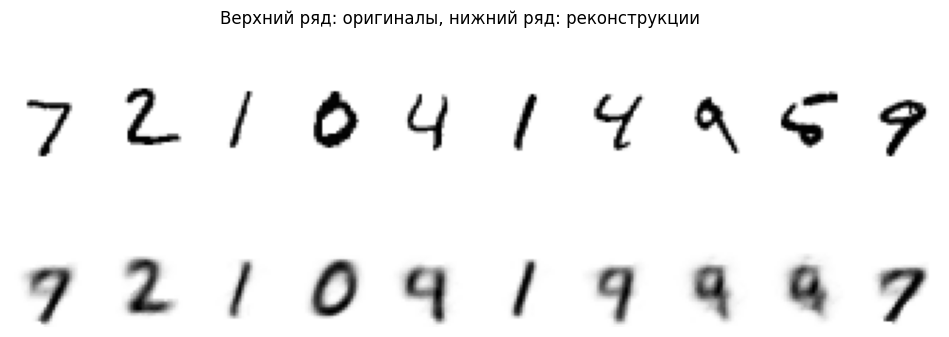

In [10]:
# делаем реконструкцию 10 тестовых изображений и сравниваем их с оригиналами
model.eval()

images, labels = next(iter(test_loader))
images = images[:10].to(device)

with torch.no_grad():
    reconstructed = model(images)

images = images.cpu()
reconstructed = reconstructed.cpu()

plt.figure(figsize=(12, 4))

for i in range(10):
    # оригинал
    plt.subplot(2, 10, i + 1)
    plt.imshow(images[i].squeeze(), cmap="gray_r")
    plt.axis("off")

    # реконструкция
    plt.subplot(2, 10, i + 11)
    plt.imshow(reconstructed[i].squeeze(), cmap="gray_r")
    plt.axis("off")

plt.suptitle("Верхний ряд: оригиналы, нижний ряд: реконструкции")
plt.show()

In [11]:
# получим латентные представления для всех тестовых изображений
model.eval()

latent_images = []
latent_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        z = model.encoder(images)

        latent_images.append(z.cpu().numpy())
        latent_labels.append(labels.numpy())

latent_images = np.concatenate(latent_images)
latent_labels = np.concatenate(latent_labels)

latent_images.shape, latent_labels.shape

((10000, 2), (10000,))

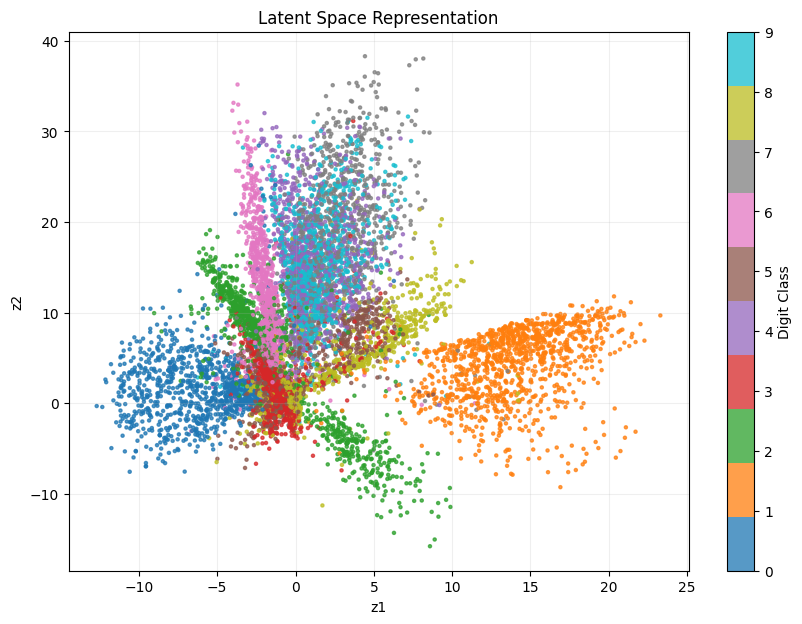

In [12]:
# визуализируем латентное пространство для тестового набора данных
plt.figure(figsize=(10, 7))
show_latent_space(
    latent_images[:, 0],
    latent_images[:, 1],
    latent_labels,
    plt.gca()
)

Выбраны индексы: A=6082 (label=0), B=8048 (label=1)


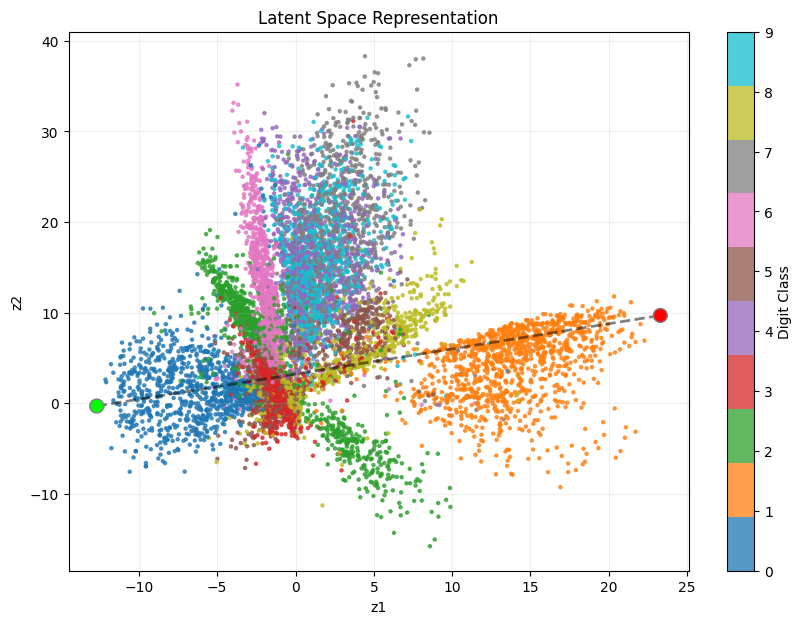

In [13]:
# теперь погуляем по латентному пространству между двумя выбранными точками, чтобы увидеть, как меняются цифры
# выбираем две точки на противоположных концах латентной плоскости
idx_a = int(np.argmin(latent_images[:, 0]))
idx_b = int(np.argmax(latent_images[:, 0]))

point_a = latent_images[idx_a]
point_b = latent_images[idx_b]

# сохраняем цифры в переменные для следующей ячейки
img_a, label_a = test_dataset[idx_a]
img_b, label_b = test_dataset[idx_b]

plt.figure(figsize=(10, 7))
show_latent_space(
    latent_images[:, 0],
    latent_images[:, 1],
    latent_labels,
    plt.gca(),
    A=point_a,
    B=point_b
)

print(f"Выбраны индексы: A={idx_a} (label={label_a}), B={idx_b} (label={label_b})")

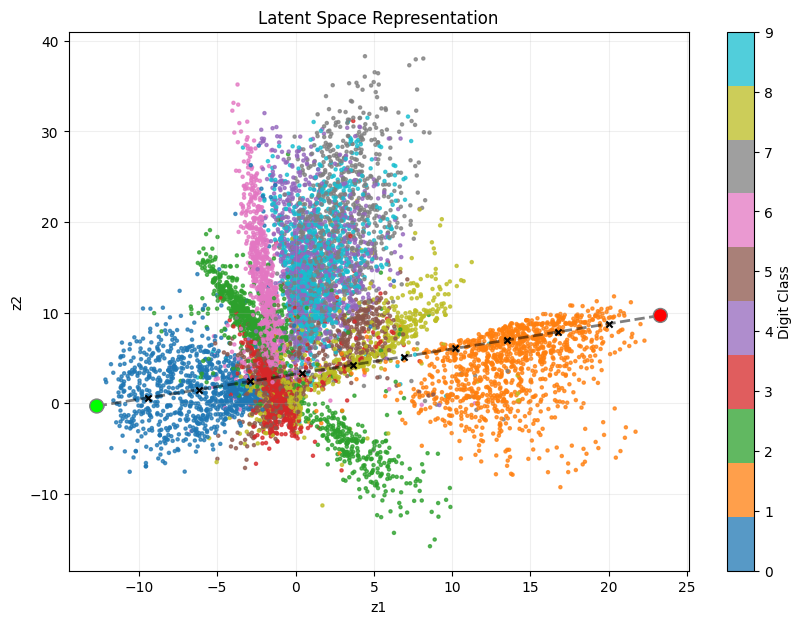

In [14]:
# функция для интерполяции между двумя изображениями в латентном пространстве
def interpolate_images(model, img1, img2, steps=10):
    model.eval()

    img1 = img1.unsqueeze(0).to(device)
    img2 = img2.unsqueeze(0).to(device)

    with torch.no_grad():
        enc1 = model.encoder(img1)
        z1 = enc1[0] if isinstance(enc1, tuple) else enc1  # если энкодер возвращает кортеж (например, для VAE)
        enc2 = model.encoder(img2)
        z2 = enc2[0] if isinstance(enc2, tuple) else enc2

        latent_points = []
        interpolated_images = []

        for alpha in torch.linspace(0, 1, steps).to(device):
            z = (1 - alpha) * z1 + alpha * z2
            latent_points.append(z.cpu())
            decoded = model.decoder(z).view(1, 28, 28)
            interpolated_images.append(decoded.cpu())

    return interpolated_images, latent_points



steps = 12
interpolated_images, latent_points = interpolate_images(model, img_a, img_b, steps=steps)

plt.figure(figsize=(10, 7))
show_latent_space(
    latent_images[:, 0],
    latent_images[:, 1],
    latent_labels,
    plt.gca(),
    A=point_a,
    B=point_b,
    points=torch.cat(latent_points, dim=0).numpy()
)

In [ ]:
from ipywidgets import interact, IntSlider

def show_interpolation(step):
    plt.figure(figsize=(3, 3))
    plt.imshow(interpolated_images[step].squeeze(), cmap="gray_r")
    plt.axis("off")
    plt.title(f"Интерполяция: {label_a} → {label_b}, шаг {step + 1}/{steps}")
    plt.show()


interact(
    show_interpolation,
    step=IntSlider(min=0, max=steps - 1, step=1, value=0, description="Шаг")
);

interactive(children=(IntSlider(value=0, description='Шаг', max=11), Output()), _dom_classes=('widget-interact…

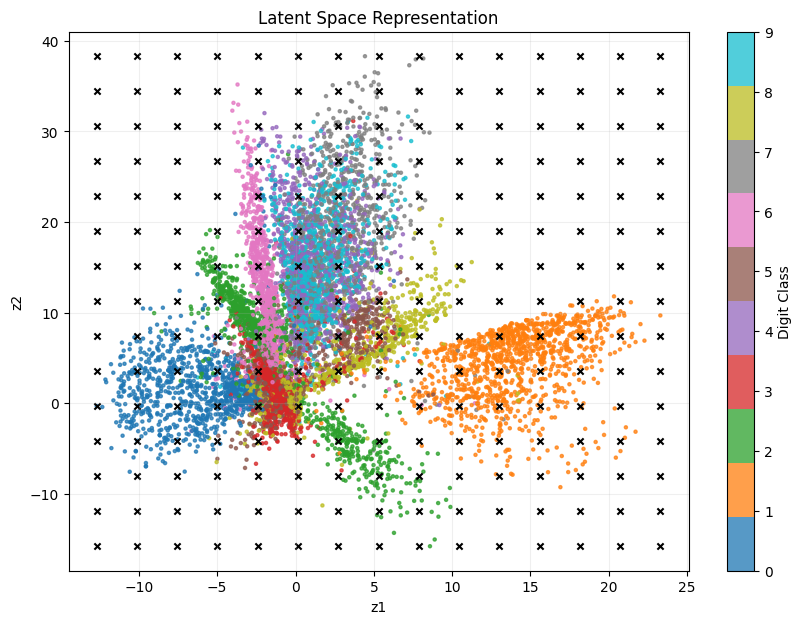

In [16]:
# зададим 15 точек в латентном пространстве и декодируем их в изображения

grid_size = 15
z1_values = np.linspace(latent_images[:, 0].min(), latent_images[:, 0].max(), grid_size)
z2_values = np.linspace(latent_images[:, 1].min(), latent_images[:, 1].max(), grid_size)

mg = np.meshgrid(z1_values, z2_values)
grid_points = np.stack(mg, axis=-1).reshape(-1, 2)

plt.figure(figsize=(10, 7))
show_latent_space(
    latent_images[:, 0],
    latent_images[:, 1],
    latent_labels,
    plt.gca(),
    points=grid_points
)

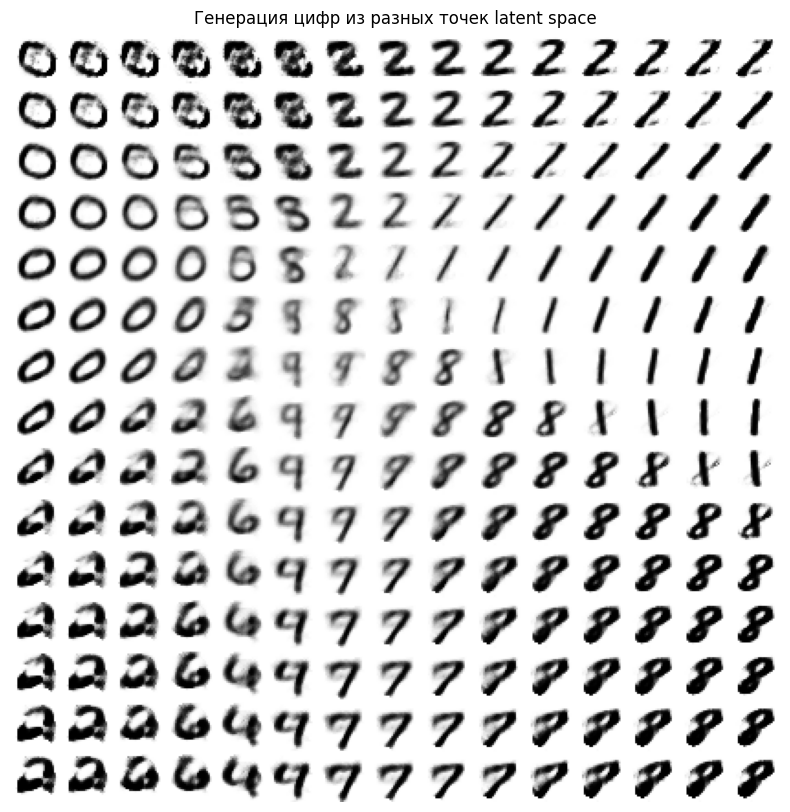

In [17]:
model.eval()

canvas = np.zeros((28 * grid_size, 28 * grid_size))

with torch.no_grad():
    for i, z2 in enumerate(z2_values):
        for j, z1 in enumerate(z1_values):
            z = torch.tensor([[z1, z2]], dtype=torch.float32).to(device)
            decoded = model.decoder(z).view(28, 28).cpu().numpy()

            canvas[
                i * 28:(i + 1) * 28,
                j * 28:(j + 1) * 28
            ] = decoded

plt.figure(figsize=(10, 10))
plt.imshow(canvas, cmap="gray_r")
plt.axis("off")
plt.title("Генерация цифр из разных точек latent space")
plt.show()

## 1.3 Вариационные автоэнкодеры (VAE)

Вариационные автоэнкодеры (VAE) - это расширение классических автоэнкодеров, которые вводят стохастический элемент в процесс кодирования и декодирования, что позволяет моделировать распределение данных в латентном пространстве.

**Ключевая идея VAE:**

Обычные автоэнкодеры кодируют так:
```
7 → z = [1.2, -0.8]
```

Вариационные автоэнкодеры кодируют так (почти так):
```
7 → μ=[1.2, -0.8], σ=[0.3, 0.2]
```

В результате получаем латентное пространство:
- гладкое
- непрерывное
- похожее на нормальное распределение.

In [18]:
class VAE(nn.Module):
    def __init__(self, latent_dim=2, hidden_neurons=128):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(28 * 28, hidden_neurons),
            nn.ReLU(),
            nn.Linear(hidden_neurons, 64),
            nn.ReLU()
        )

        self.fc_mu = nn.Linear(64, latent_dim)
        self.fc_logvar = nn.Linear(64, latent_dim)

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, hidden_neurons),
            nn.ReLU(),
            nn.Linear(hidden_neurons, 28 * 28),
            nn.Sigmoid()
        )

    def encode(self, x):
        h = self.encoder(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

    # функция-семплер для получения z из mu и logvar
    def reparameterize(self, mu, logvar): # log(σ²)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z

    def decode(self, z):
        x = self.decoder(z)
        return x.view(-1, 1, 28, 28)

    def forward(self, x):

        mu, logvar = self.encode(x) # закодируй
        z = self.reparameterize(mu, logvar) # сэмплируй из латентного пространства
        reconstructed = self.decode(z) # декодируй обратно в изображение

        return reconstructed, mu, logvar


model_vae = VAE(latent_dim=2).to(device)

In [19]:
# Функция потерь для VAE:
# включает в себя ошибку реконструкции,
# а также KL-дивергенцию между распределением в латентном пространстве и нормальным распределением
# то есть:
#  - ошибку реконструкции (насколько хорошо декодер восстанавливает изображение)
#  - штраф за плохое латентное пространство

def vae_loss(reconstructed, x, mu, logvar):
    reconstruction_loss = nn.functional.binary_cross_entropy(
        reconstructed,
        x,
        reduction="sum"
    )

    kl_loss = -0.5 * torch.sum(
        1 + logvar - mu.pow(2) - logvar.exp()
    )

    return reconstruction_loss + kl_loss

In [20]:
optimizer = optim.Adam(model_vae.parameters(), lr=1e-3)

epochs = 20

for epoch in range(epochs):
    model_vae.train()
    total_loss = 0

    for images, _ in train_loader:
        images = images.to(device)

        reconstructed, mu, logvar = model_vae(images)
        loss = vae_loss(reconstructed, images, mu, logvar)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(train_dataset)
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}")

Epoch [1/20], Loss: 223.6771
Epoch [2/20], Loss: 177.1062
Epoch [3/20], Loss: 168.7231
Epoch [4/20], Loss: 163.7359
Epoch [5/20], Loss: 160.6530
Epoch [6/20], Loss: 158.5457
Epoch [7/20], Loss: 157.0347
Epoch [8/20], Loss: 155.7518
Epoch [9/20], Loss: 154.6039
Epoch [10/20], Loss: 153.6012
Epoch [11/20], Loss: 152.6678
Epoch [12/20], Loss: 151.9681
Epoch [13/20], Loss: 151.4334
Epoch [14/20], Loss: 150.6765
Epoch [15/20], Loss: 150.2153
Epoch [16/20], Loss: 149.5726
Epoch [17/20], Loss: 149.1051
Epoch [18/20], Loss: 148.5689
Epoch [19/20], Loss: 148.1321
Epoch [20/20], Loss: 147.7134


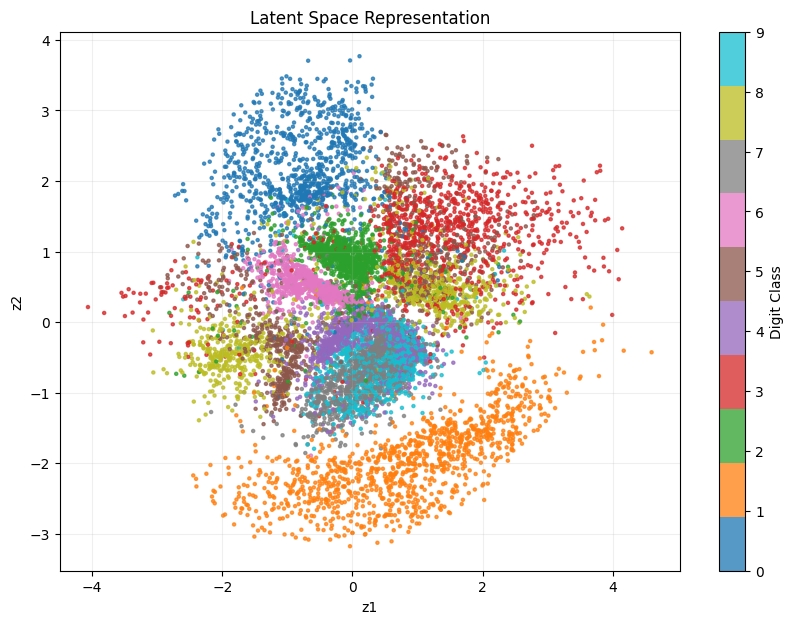

In [21]:
# визуализируем латентное пространство, в котором каждая точка — это мат. ожидание латентного вектора, а цвет — её класс
model.eval()

latent_images_vae = []
latent_labels_vae = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)

        mu, logvar = model_vae.encode(images)

        latent_images_vae.append(mu.cpu().numpy())
        latent_labels_vae.append(labels.numpy())

latent_images_vae = np.concatenate(latent_images_vae)
latent_labels_vae = np.concatenate(latent_labels_vae)

plt.figure(figsize=(10, 7))
show_latent_space(
    latent_images_vae[:, 0],
    latent_images_vae[:, 1],
    latent_labels_vae,
    plt.gca()
)

In [22]:
# интерполяция между двумя изображениями в латентном пространстве VAE
def interpolate_vae(model, img1, img2, steps=12):
    model.eval()

    img1 = img1.unsqueeze(0).to(device)
    img2 = img2.unsqueeze(0).to(device)

    with torch.no_grad():
        mu1, _ = model.encode(img1)
        mu2, _ = model.encode(img2)

        points = []
        images = []

        for alpha in torch.linspace(0, 1, steps).to(device):
            z = (1 - alpha) * mu1 + alpha * mu2
            points.append(z.cpu())
            decoded = model.decode(z)
            images.append(decoded.cpu())

    return images, points

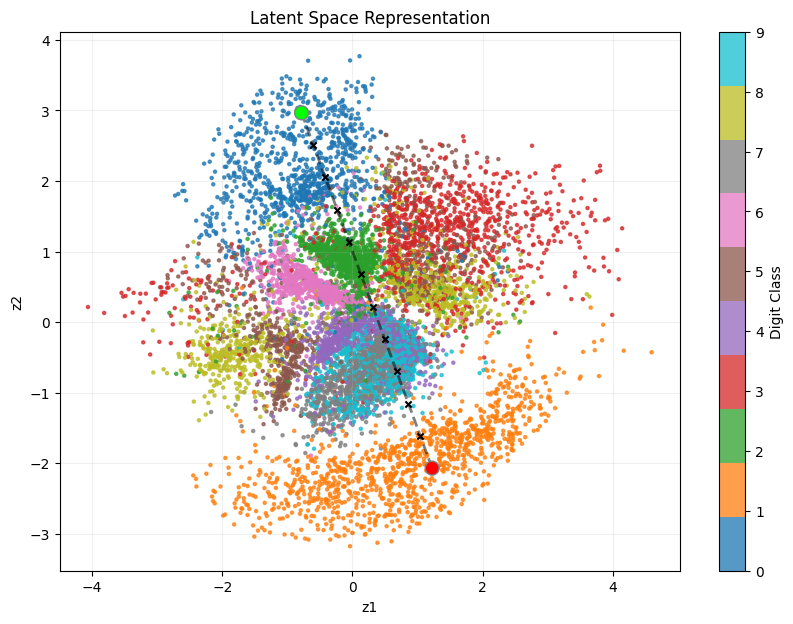

In [23]:
# погуляем по латентному пространству и посмотрим, что нам встретится на пути.
# найдем те же точки, что и в предыдущем примере, но теперь в латентном пространстве VAE
point_a = latent_images_vae[idx_a]
point_b = latent_images_vae[idx_b]

steps = 12
interpolated_images, latent_points = interpolate_vae(model_vae, img_a, img_b, steps=steps)

plt.figure(figsize=(10, 7))
show_latent_space(
    latent_images_vae[:, 0],
    latent_images_vae[:, 1],
    latent_labels,
    plt.gca(),
    A=point_a,
    B=point_b,
    points=torch.cat(latent_points, dim=0).numpy()
)

In [24]:
def show_interpolation(step):
    plt.figure(figsize=(3, 3))
    plt.imshow(interpolated_images[step].squeeze(), cmap="gray_r")
    plt.axis("off")
    plt.title(f"Интерполяция: {label_a} → {label_b}, шаг {step + 1}/{steps}")
    plt.show()


interact(
    show_interpolation,
    step=IntSlider(min=0, max=steps - 1, step=1, value=0, description="Шаг")
);

interactive(children=(IntSlider(value=0, description='Шаг', max=11), Output()), _dom_classes=('widget-interact…

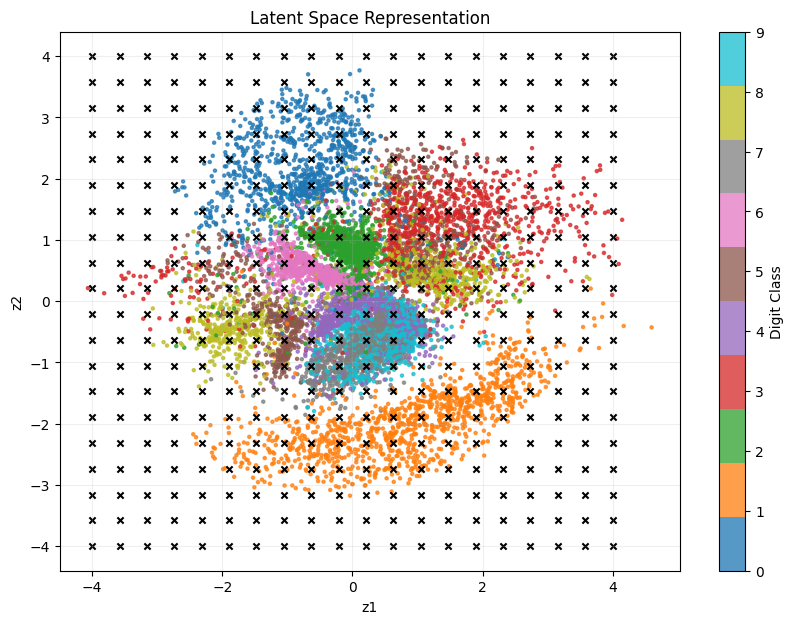

In [25]:
grid_size = 20
z1_values = np.linspace(-4, 4, grid_size)
z2_values = np.linspace(-4, 4, grid_size)

mg = np.meshgrid(z1_values, z2_values)
grid_points = np.stack(mg, axis=-1).reshape(-1, 2)

plt.figure(figsize=(10, 7))
show_latent_space(
    latent_images_vae[:, 0],
    latent_images_vae[:, 1],
    latent_labels,
    plt.gca(),
    points=grid_points
)

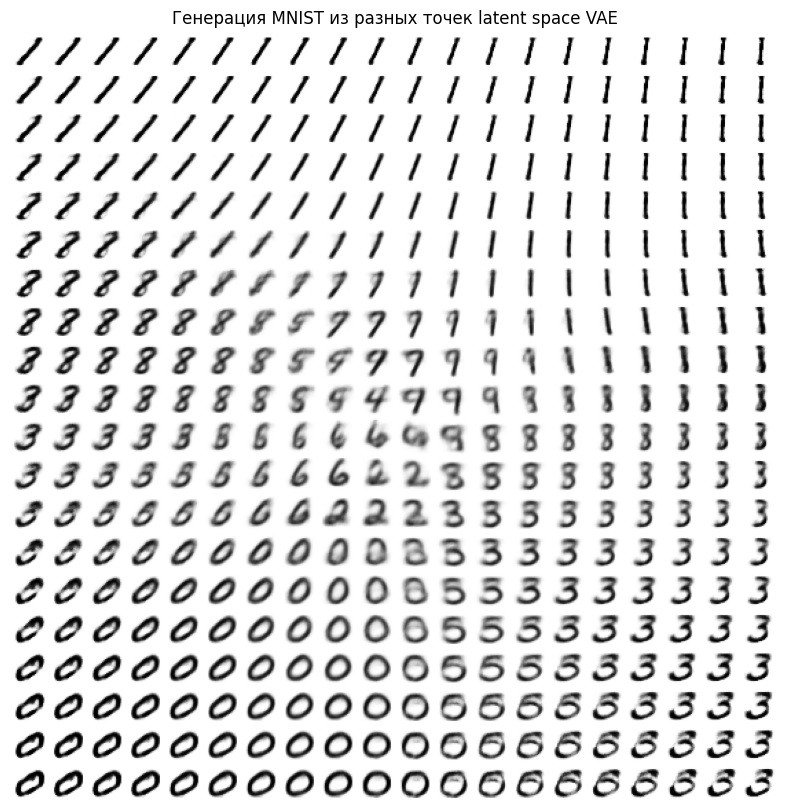

In [26]:
model_vae.eval()

canvas = np.zeros((28 * grid_size, 28 * grid_size))

with torch.no_grad():
    for i, z2 in enumerate(z2_values):
        for j, z1 in enumerate(z1_values):
            z = torch.tensor([[z1, z2]], dtype=torch.float32).to(device)
            generated = model_vae.decode(z).squeeze().cpu().numpy()

            canvas[
                i * 28:(i + 1) * 28,
                j * 28:(j + 1) * 28
            ] = generated

plt.figure(figsize=(10, 10))
plt.imshow(canvas, cmap="gray_r")
plt.axis("off")
plt.title("Генерация MNIST из разных точек latent space VAE")
plt.show()

## 1.4 🌡️ Температура сэмплирования из латентного пространства

Познакомимся с таким параметром, как `temperature`, который позволяет контролировать разнообразие генерируемых примеров:
```
temperature = 0.0 → почти обычный autoencoder, берём только mu
temperature = 0.5 → аккуратные вариации
temperature = 1.0 → стандартный VAE
temperature = 2.0 → более разнообразные, но менее стабильные изображения

In [27]:
def sample_z(mu, logvar, temperature=1.0):
    """
    Сэмплирует z из распределения, заданного mu и logvar, с контролем температуры.
    - mu: мат. ожидание латентного вектора
    - logvar: логарифм дисперсии латентного вектора
    - temperature: параметр, контролирующий разнообразие генерируемых примеров (чем выше, тем более разнообразные примеры)
    """
    std = torch.exp(0.5 * logvar)
    eps = torch.randn_like(std)
    z = mu + temperature * eps * std
    return z

T: 0.0 z: [0.7885391  0.03654196]
T: 0.25 z: [0.80012536 0.04785084]
T: 0.5 z: [0.8064008  0.02369332]
T: 1.0 z: [0.7835532  0.07903077]
T: 1.5 z: [ 0.6707582  -0.00373513]
T: 2.0 z: [ 0.920233   -0.16121885]
T: 4.0 z: [0.70735073 0.13382265]
T: 8.0 z: [ 0.7053827 -1.0856371]
T: 16.0 z: [ 1.6783285 -1.2105832]


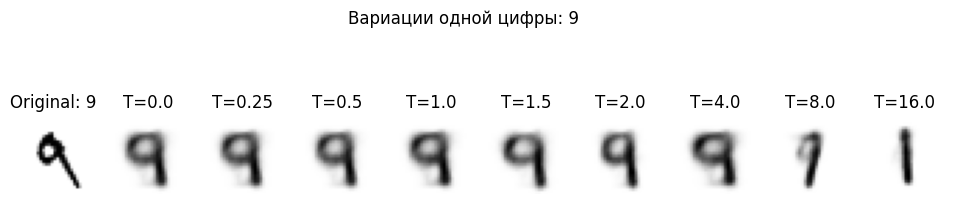

In [32]:
model_vae.eval()

img_src, label = test_dataset[7]
img = img_src.unsqueeze(0).to(device)

with torch.no_grad():
    mu, logvar = model_vae.encode(img)

temperatures = [0.0, 0.25, 0.5, 1.0, 1.5, 2.0, 4.0, 8.0, 16.0]

plt.figure(figsize=(12, 3))

plt.subplot(1, len(temperatures) + 1, 1)
plt.imshow(img_src[0, :, :], cmap="gray_r")
plt.axis("off")
plt.title(f"Original: {label}")

for i, t in enumerate(temperatures):
    with torch.no_grad():
        z = sample_z(mu, logvar, temperature=t)
        print("T: {} z: {}".format(t, z.cpu().numpy().flatten()))
        generated = model_vae.decode(z).cpu()

    plt.subplot(1, len(temperatures) + 1, i + 1 + 1)
    plt.imshow(generated.squeeze(), cmap="gray_r")
    plt.axis("off")
    plt.title(f"T={t}")

plt.suptitle(f"Вариации одной цифры: {label}")
plt.show()

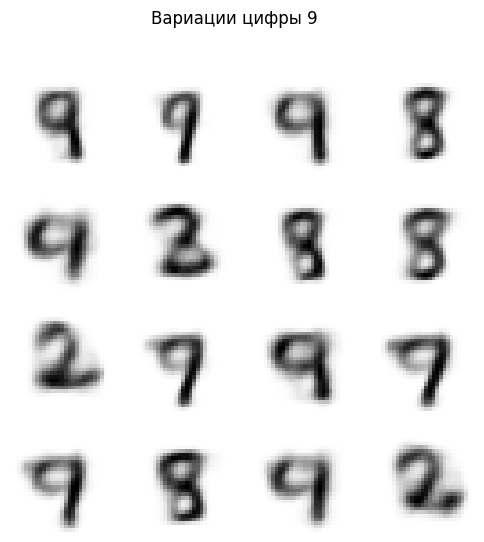

In [37]:
# вариации одной цифры с разными температурами
def generate_variations(model, image, n=16, temperature=1.0):
    model.eval()

    image = image.unsqueeze(0).to(device)

    with torch.no_grad():
        mu, logvar = model.encode(image)

        images = []
        for _ in range(n):
            z = sample_z(mu, logvar, temperature=temperature)
            decoded = model.decode(z).cpu()
            images.append(decoded)

    return images

img, label = test_dataset[7]

variations = generate_variations(
    model_vae,
    img,
    n=16,
    temperature=8.0
)

plt.figure(figsize=(6, 6))

for i, generated in enumerate(variations):
    plt.subplot(4, 4, i + 1)
    plt.imshow(generated.squeeze(), cmap="gray_r")
    plt.axis("off")

plt.suptitle(f"Вариации цифры {label}")
plt.show()

In [ ]:
import gc

model.to('cpu')
del model

model_vae.to('cpu')
del model_vae

gc.collect()
torch.cuda.empty_cache() 

In [38]:
!pip install -U diffusers transformers accelerate safetensors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 45.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 58.6 MB/s  0:00:00
  Attempting uninstall: safetensors
    Found existing installation: safetensors 0.7.0
    Uninstalling safetensors-0.7.0:
      Successfully uninstalled safetensors-0.7.0
  Attempting uninstall: accelerate━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 3/6 [diffusers]
    Found existing installation: accelerate 1.13.07m╺━━━━━━━━━━━━━━━━━━━ 3/6 [diffusers]
    Uninstalling accelerate-1.13.0:━━╺━━━━━━━━━━━━━━━━━━━ 3/6 [diffusers]
      Successfully uninstalled accelerate-1.13.0237m╺━━━━━━━━━━━━━━━━━━━ 3/6 [diffusers]
  Attempting uninstall: transformers━━━━━━━━━━━╸━━━━━━━━━━━━━ 4/6 [accelerate]
    Found existing installation: transformers 5.6.1;2;249;38;114m╸━━━━━━━━━━━━━ 4/6 [accelerate]
    Uninstalling transformers-5.6.1:━━━━━━━━━━━━━━━━━━╺━━━━━━ 5/6 [transformers]]
      Successfully uninstalled transformers-5.6.1━╺━━━━━━ 5/6 [transformers]
   ━━━━━━━━━━

In [69]:
from pathlib import Path
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionXLPipeline, DPMSolverMultistepScheduler

# model_path = Path("~/models/checkpoints/realismEngineSDXL_v30VAE.safetensors").expanduser()

# pipe = StableDiffusionXLPipeline.from_single_file(
#     str(model_path),
#     torch_dtype=torch.float16,
#     safety_checker=None,
#     local_files_only=True,
# )

model_path = Path("~/models/checkpoints/Deliberate_v2.safetensors").expanduser()

pipe = StableDiffusionPipeline.from_single_file(
    str(model_path),
    torch_dtype=torch.float16,
    safety_checker=None,
    local_files_only=True,
)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(
    pipe.scheduler.config,
    use_karras_sigmas=True
)

pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

There are modules in UNet2DConditionModel that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.
There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For

In [70]:
prompt = """
photorealistic portrait of a fictional young woman,
natural face, expressive eyes, soft daylight,
50mm lens, shallow depth of field,
cinematic, detailed skin, realistic, high quality
"""

negative_prompt = """
bad hands, bad anatomy, ugly, deformed,
face asymmetry, eyes asymmetry, deformed eyes,
deformed mouth, open mouth, low quality, blurry,
cartoon, anime, painting, illustration
"""

width = 512
height = 512
num_inference_steps = 35
guidance_scale = 5.5

In [71]:
# Helper functions

def make_latents(seed, width=832, height=832):
    generator = torch.Generator(device=device).manual_seed(seed)

    latents = torch.randn(
        (1, pipe.unet.config.in_channels, height // 8, width // 8),
        generator=generator,
        device=device,
        dtype=dtype,
    )

    return latents


def generate_from_latents(latents):
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        width=width,
        height=height,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        latents=latents,
    ).images[0]

    return image


def show_grid(images, titles=None, cols=4, figsize=(16, 8)):
    rows = int(np.ceil(len(images) / cols))
    plt.figure(figsize=figsize)

    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        if titles:
            plt.title(titles[i])

    plt.tight_layout()
    plt.show()


def slerp(t, v0, v1, DOT_THRESHOLD=0.9995):
    """
    Spherical linear interpolation.
    Лучше обычной линейной интерполяции для latent noise.
    """

    v0_np = v0.detach().float().cpu().numpy()
    v1_np = v1.detach().float().cpu().numpy()

    dot = np.sum(v0_np * v1_np) / (
        np.linalg.norm(v0_np) * np.linalg.norm(v1_np)
    )

    if abs(dot) > DOT_THRESHOLD:
        result = v0_np + t * (v1_np - v0_np)
        return torch.from_numpy(result).to(device=device, dtype=dtype)

    theta_0 = np.arccos(dot)
    sin_theta_0 = np.sin(theta_0)

    theta_t = theta_0 * t
    sin_theta_t = np.sin(theta_t)

    s0 = np.sin(theta_0 - theta_t) / sin_theta_0
    s1 = sin_theta_t / sin_theta_0

    result = s0 * v0_np + s1 * v1_np
    return torch.from_numpy(result).to(device=device, dtype=dtype)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

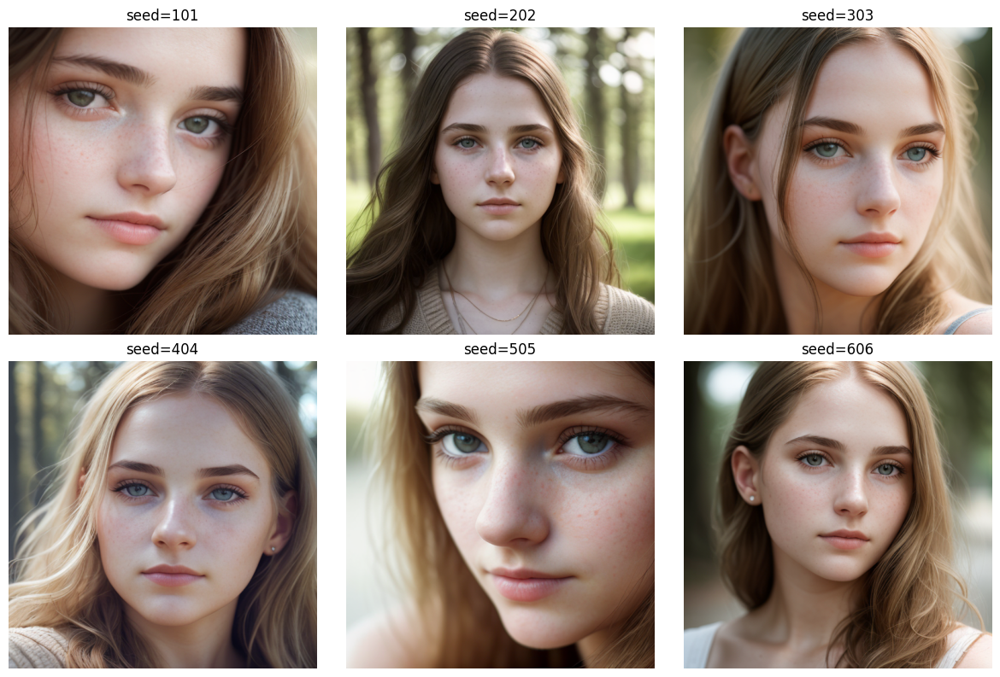

In [72]:
# Генерируем несколько портретов-кандидатов

seeds = [101, 202, 303, 404, 505, 606]

candidate_images = []
candidate_latents = []

for seed in seeds:
    latents = make_latents(seed, width, height)
    image = generate_from_latents(latents)

    candidate_latents.append(latents)
    candidate_images.append(image)

show_grid(
    candidate_images,
    titles=[f"seed={s}" for s in seeds],
    cols=3,
    figsize=(12, 8)
)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

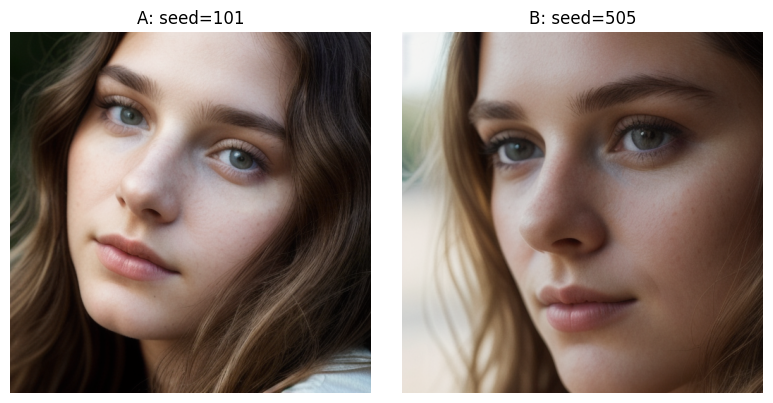

In [50]:
# Выбираем два портрета

seed_a = 101
seed_b = 505

latents_a = make_latents(seed_a, width, height)
latents_b = make_latents(seed_b, width, height)

image_a = generate_from_latents(latents_a)
image_b = generate_from_latents(latents_b)

show_grid(
    [image_a, image_b],
    titles=[f"A: seed={seed_a}", f"B: seed={seed_b}"],
    cols=2,
    figsize=(8, 4)
)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

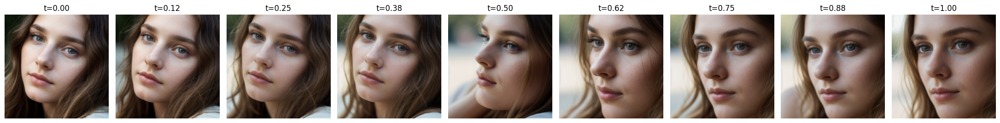

In [51]:
# Идём между ними в латентном пространстве

steps = 9
ts = np.linspace(0, 1, steps)

interpolated_images = []

for t in ts:
    latents_t = slerp(t, latents_a, latents_b)
    image_t = generate_from_latents(latents_t)
    interpolated_images.append(image_t)

show_grid(
    interpolated_images,
    titles=[f"t={t:.2f}" for t in ts],
    cols=steps,
    figsize=(22, 4)
)

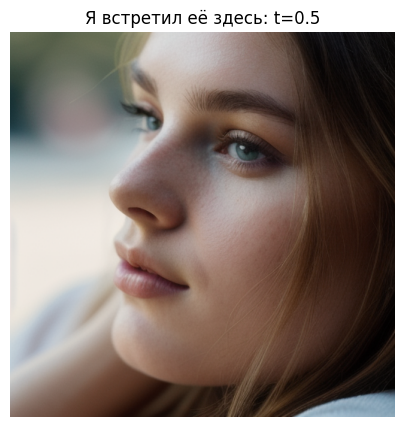

In [52]:
# Сохраняем “встреченный” промежуточный образ

meet_index = steps // 2
met_her = interpolated_images[meet_index]

met_her.save("met_her_in_latent_space.png")

plt.figure(figsize=(5, 5))
plt.imshow(met_her)
plt.axis("off")
plt.title("Я встретил её здесь: t=0.5")
plt.show()

In [53]:
# Делаем GIF для ролика

interpolated_images[0].save(
    "latent_space_walk.gif",
    save_all=True,
    append_images=interpolated_images[1:],
    duration=350,
    loop=0,
)

In [73]:
display(Image(filename="latent_space_walk.gif"))

TypeError: 'module' object is not callable

In [146]:
# MODEL_PATH = Path("~/models/checkpoints/Deliberate_v6 (SFW).safetensors").expanduser()
# MODEL_PATH = Path("~/models/checkpoints/Deliberate_v2.safetensors").expanduser()
MODEL_PATH = Path("~/models/checkpoints/juggernaut_aftermath.safetensors").expanduser()
# или:
# MODEL_PATH = Path("~/models/CyberRealistic.safetensors").expanduser()

device = "cuda"
dtype = torch.float16

pipe = StableDiffusionPipeline.from_single_file(
    MODEL_PATH,
    torch_dtype=dtype,
    safety_checker=None,
    local_files_only=True,
)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(
    pipe.scheduler.config,
    use_karras_sigmas=True
)

pipe = pipe.to(device)
pipe.enable_attention_slicing()

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

There are modules in UNet2DConditionModel that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.
There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For

In [123]:
width = 512
height = 512
steps = 30
guidance_scale = 6.5

negative_prompt = """
bad anatomy, ugly, deformed, low quality, blurry,
cartoon, anime, painting, illustration,
asymmetrical eyes, deformed face, bad teeth
"""

In [143]:
base_prompt = """
RAW photo, realistic portrait photograph of young woman,
black hair, brown eyes,
looking directly into the camera,
front view,
head shot,
centered composition,
sport outfit, spandex,
city park background,
gentle smile,
natural daylight,
detailed skin texture,
50mm lens,
photorealistic,
highly detailed"""

prompt_a = base_prompt.replace("young woman", "young chubby Nordic woman").replace("black hair", "long blonde hair").replace("brown eyes", "blue eyes")

# prompt_b = base_prompt.replace("young woman", "young petite Asian woman").replace("black hair", "short black hair").replace("brown eyes", "dark brown eyes")
prompt_b = base_prompt.replace("young woman", "young brunette chubby Italian woman").replace("black hair", "curly black hair").replace("brown eyes", "dark brown eyes")

In [77]:
def make_latents(seed):
    generator = torch.Generator(device=device).manual_seed(seed)
    return torch.randn(
        (1, pipe.unet.config.in_channels, height // 8, width // 8),
        generator=generator,
        device=device,
        dtype=dtype,
    )


def encode_prompt(prompt):
    text_inputs = pipe.tokenizer(
        prompt,
        padding="max_length",
        max_length=pipe.tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt",
    )

    text_input_ids = text_inputs.input_ids.to(device)

    with torch.no_grad():
        prompt_embeds = pipe.text_encoder(text_input_ids)[0]

    return prompt_embeds


def lerp(t, a, b):
    return (1 - t) * a + t * b


def slerp(t, v0, v1, dot_threshold=0.9995):
    v0_float = v0.float()
    v1_float = v1.float()

    v0_norm = v0_float / torch.norm(v0_float)
    v1_norm = v1_float / torch.norm(v1_float)

    dot = torch.sum(v0_norm * v1_norm)

    if torch.abs(dot) > dot_threshold:
        return lerp(t, v0, v1)

    theta_0 = torch.acos(dot)
    sin_theta_0 = torch.sin(theta_0)

    theta_t = theta_0 * t
    sin_theta_t = torch.sin(theta_t)

    s0 = torch.sin(theta_0 - theta_t) / sin_theta_0
    s1 = sin_theta_t / sin_theta_0

    return s0 * v0 + s1 * v1

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

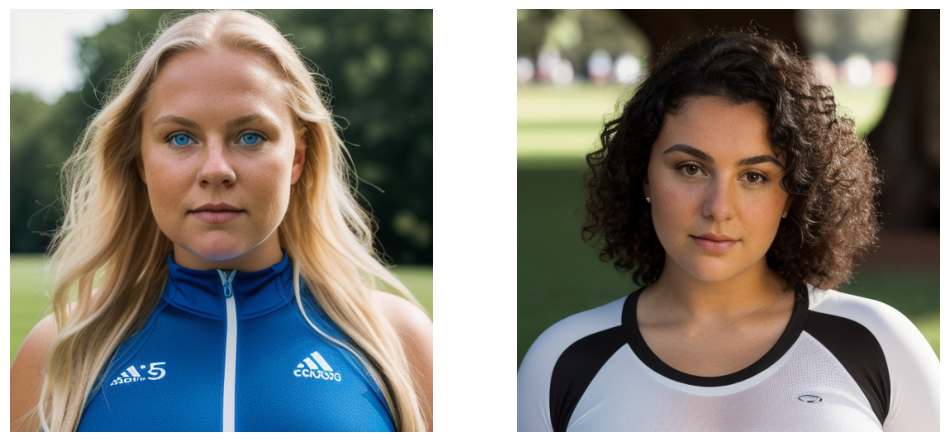

In [147]:
latents_a = make_latents(42)
latents_b = make_latents(100500)

prompt_embeds_a = encode_prompt(prompt_a)
prompt_embeds_b = encode_prompt(prompt_b)

negative_embeds = encode_prompt(negative_prompt)

image_a = pipe(
        prompt_embeds=prompt_embeds_a,
        negative_prompt_embeds=negative_embeds,
        latents=latents_a,
        width=width,
        height=height,
        num_inference_steps=steps,
        guidance_scale=guidance_scale,
    ).images[0]

image_b = pipe(
        prompt_embeds=prompt_embeds_b,
        negative_prompt_embeds=negative_embeds,
        latents=latents_b,
        width=width,
        height=height,
        num_inference_steps=steps,
        guidance_scale=guidance_scale,
    ).images[0]

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image_a)
axes[0].axis("off")

axes[1].imshow(image_b)
axes[1].axis("off")

plt.show()


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

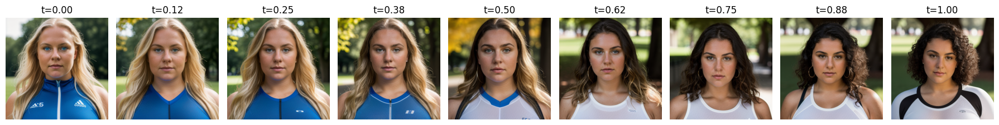

In [148]:
images = []
ts = np.linspace(0, 1, 9)

for t in ts:
    latents_t = slerp(float(t), latents_a, latents_b)
    prompt_embeds_t = lerp(float(t), prompt_embeds_a, prompt_embeds_b)

    image = pipe(
        prompt_embeds=prompt_embeds_t,
        negative_prompt_embeds=negative_embeds,
        latents=latents_t,
        width=width,
        height=height,
        num_inference_steps=steps,
        guidance_scale=guidance_scale,
    ).images[0]

    images.append(image)

plt.figure(figsize=(18, 5))

for i, img in enumerate(images):
    plt.subplot(1, len(images), i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"t={ts[i]:.2f}")

plt.tight_layout()
plt.show()

In [197]:
# MODEL_PATH = Path("~/models/checkpoints/Deliberate_v6 (SFW).safetensors").expanduser()
# MODEL_PATH = Path("~/models/checkpoints/Deliberate_v2.safetensors").expanduser()
MODEL_PATH = Path("~/models/checkpoints/juggernaut_aftermath.safetensors").expanduser()
# или:
# MODEL_PATH = Path("~/models/CyberRealistic.safetensors").expanduser()

device = "cuda"
dtype = torch.float16

pipe = StableDiffusionPipeline.from_single_file(
    MODEL_PATH,
    torch_dtype=dtype,
    safety_checker=None,
    local_files_only=True,
)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(
    pipe.scheduler.config,
    use_karras_sigmas=True
)

pipe = pipe.to(device)
pipe.enable_attention_slicing()

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

There are modules in UNet2DConditionModel that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.
There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For

In [191]:
width = 512
height = 768
steps = 30
guidance_scale = 6.5

base_prompt = """
RAW photo, realistic portrait photograph of young woman,
spandex, city park background,
frontal face, portrait,
straight-on view,
looking directly into camera,
head centered,
symmetrical composition,
front-facing portrait,
head and shoulders only,
studio lighting,
photorealistic,
50mm lens
"""

prompts = [
    base_prompt.replace(
        "young woman",
        "young chubby Nordic woman, long blonde hair, blue eyes"
    ),

    base_prompt.replace(
        "young woman",
        "chubby young redhead Irish woman, red hair, green eyes"
    ),

    base_prompt.replace(
        "young woman",
        "chubby young East European woman, chestnut brown hair, hazel eyes"
    ),

    base_prompt.replace(
        "young woman",
        "young chubby Italian woman, curly black hair, dark brown eyes"
    ),

    base_prompt.replace(
        "young woman",
        "young chubby East Asian woman, straight black hair, dark brown eyes"
    ),
]

seeds = [int(x) for x in np.array([101, 202, 303, 404, 505]) * 100500]
seeds

[10150500, 20301000, 30451500, 40602000, 50752500]

In [150]:
def show_grid(images, titles=None, cols=5, figsize=(16, 8)):
    rows = int(np.ceil(len(images) / cols))
    plt.figure(figsize=figsize)

    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        if titles:
            plt.title(titles[i], fontsize=9)

    plt.tight_layout()
    plt.show()

In [192]:
negative_prompt = """
profile,
side view,
three quarter view,
3/4 view,
looking away,
looking sideways,
looking to the side,
head tilt,
tilted head,
rotated body,
shoulder turned,
over the shoulder,
dynamic pose,
candid photo,
hand on face,
hand near face,
cropped face,
close-up
"""

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

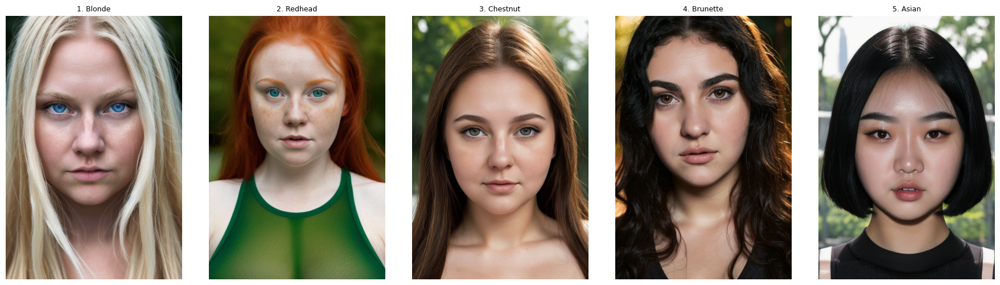

In [198]:

vertex_latents = [make_latents(seed) for seed in seeds]
vertex_embeds = [encode_prompt(prompt) for prompt in prompts]
negative_embeds = encode_prompt(negative_prompt)

vertex_images = []

for prompt, latents in zip(prompts, vertex_latents):
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        latents=latents,
        width=width,
        height=height,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
    ).images[0]

    vertex_images.append(image)

show_grid(
    vertex_images,
    titles=[
        "1. Blonde",
        "2. Redhead",
        "3. Chestnut",
        "4. Brunette",
        "5. Asian",
    ],
    cols=5,
    figsize=(18, 5)
)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

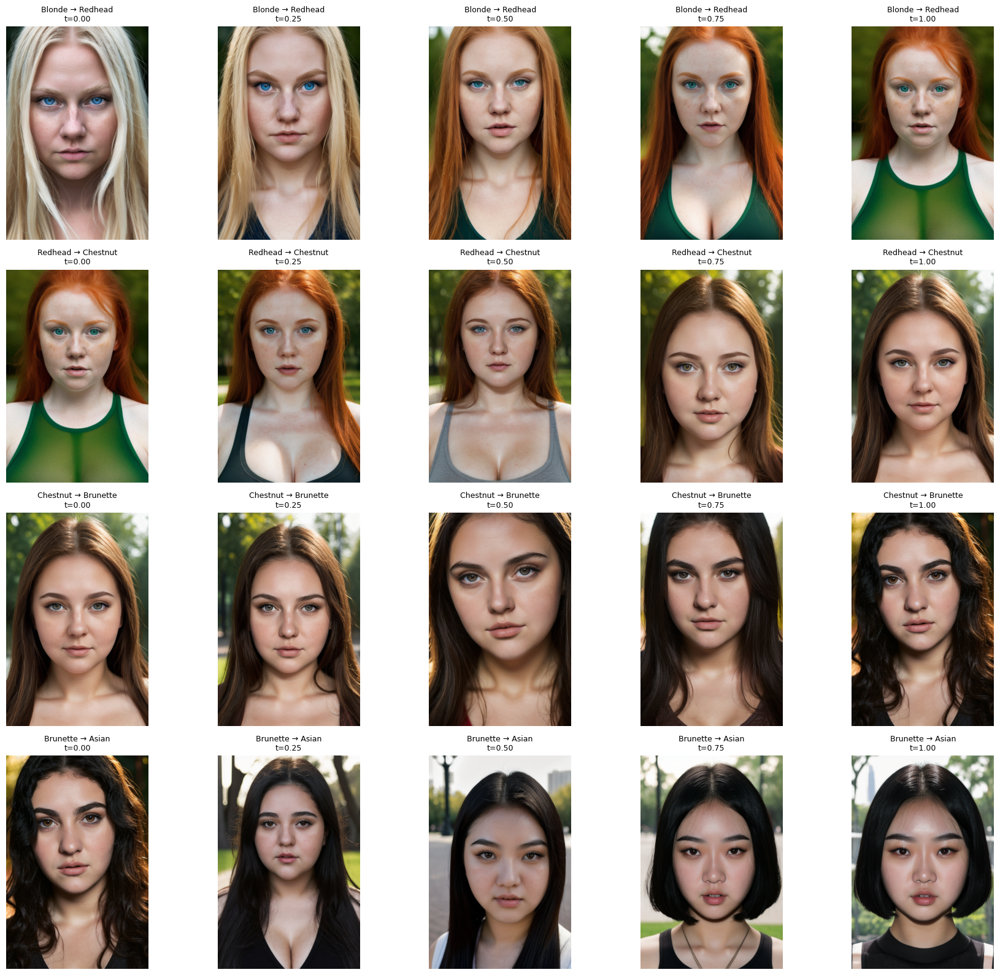

In [199]:
images = []
titles = []

points_per_stage = 5

stage_names = [
    "Blonde → Redhead",
    "Redhead → Chestnut",
    "Chestnut → Brunette",
    "Brunette → Asian",
]

for stage_idx in range(4):
    latents_a = vertex_latents[stage_idx]
    latents_b = vertex_latents[stage_idx + 1]

    embeds_a = vertex_embeds[stage_idx]
    embeds_b = vertex_embeds[stage_idx + 1]

    for local_idx in range(points_per_stage):
        t = local_idx / (points_per_stage - 1)

        latents_t = slerp(t, latents_a, latents_b)
        embeds_t = lerp(t, embeds_a, embeds_b)

        image = pipe(
            prompt_embeds=embeds_t,
            negative_prompt_embeds=negative_embeds,
            latents=latents_t,
            width=width,
            height=height,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
        ).images[0]

        images.append(image)
        titles.append(f"{stage_names[stage_idx]}\nt={t:.2f}")

show_grid(
    images,
    titles=titles,
    cols=5,
    figsize=(18, 16)
)

In [200]:
# Сохранение кадров

out_dir = Path("latent_walk_20_frames")
out_dir.mkdir(exist_ok=True)

for i, img in enumerate(images):
    img.save(out_dir / f"frame_{i:02d}.png")

In [201]:
images[0].save(
    "latent_walk_blonde_to_asian.gif",
    save_all=True,
    append_images=images[1:],
    duration=300,
    loop=0,
)